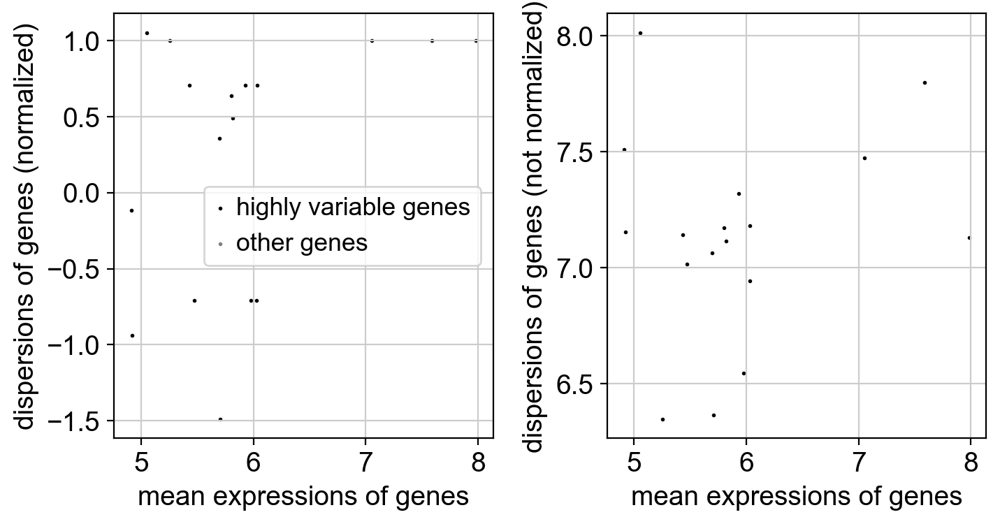

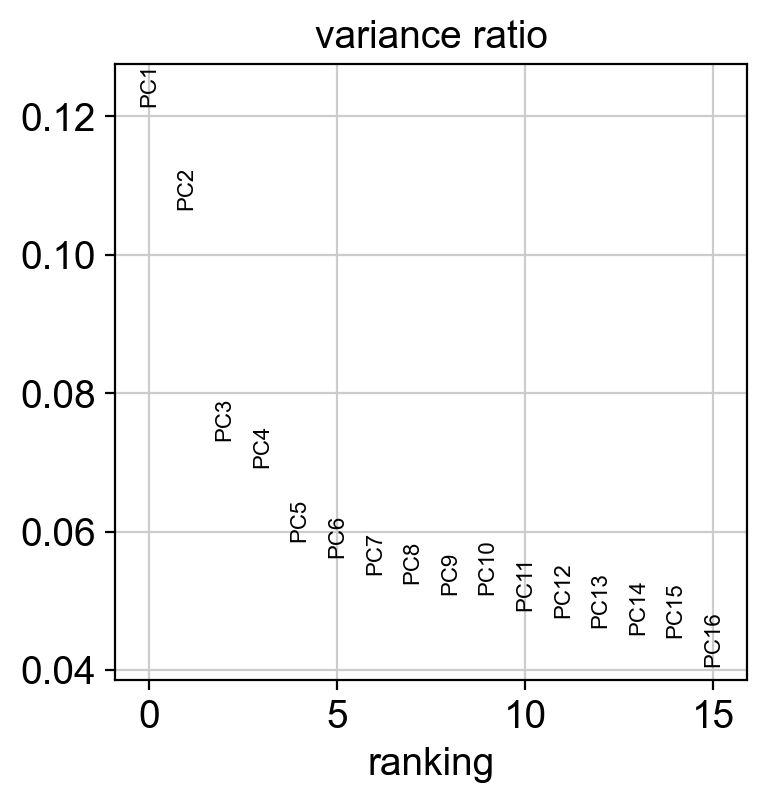

/Users/clark/Desktop/wang/protein_visualization_app/env/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/var/folders/y6/ghf8fc2163d3whgtrndyn7b80000gn/T/ipykernel_20671/2865022823.py:56: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.1)  # Leiden is similar to Louvain used in Seurat


Clustering Completed


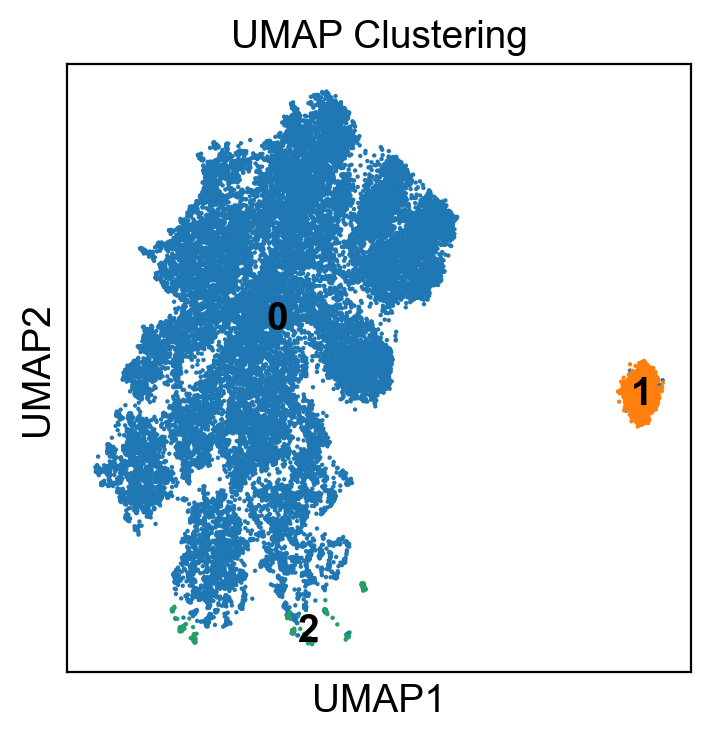

/Users/clark/Desktop/wang/protein_visualization_app/env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/Users/clark/Desktop/wang/protein_visualization_app/env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/Users/clark/Desktop/wang/protein_visualization_app/env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


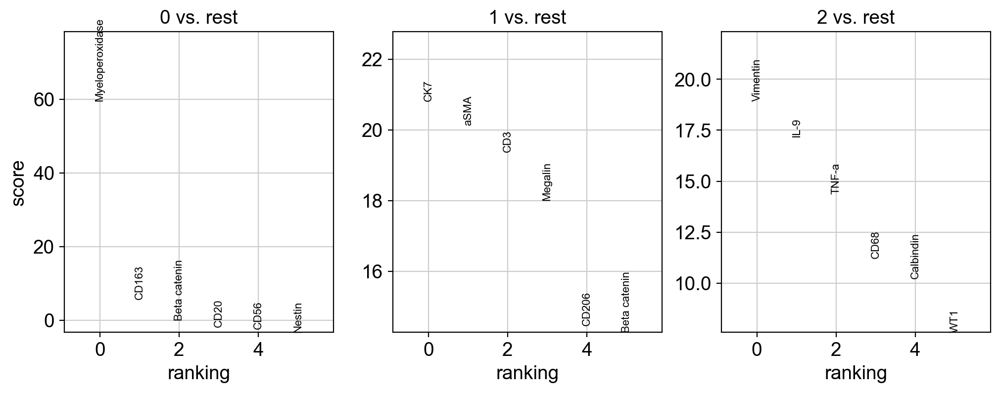

In [2]:
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import anndata as ad

# Clear environment (equivalent to rm(list=ls()))
# In Python, this is not typically needed as variables are managed differently

# Set plotting defaults
sc.settings.set_figure_params(dpi=100, frameon=True)

# Reading the excel file into a DataFrame
input_path = "/Users/clark/Desktop/wang/protein_visualization_app/ui/analysis/graphing/Grouped Cells Biopsy Data.xlsx"
data_origin = pd.read_excel(input_path, sheet_name='Sheet1')

# Subset the data to only include protein expression values (columns 4 to end)
data_1 = data_origin.iloc[:, 3:]  # Python is 0-indexed, so 4th column is index 3

# Transpose the data matrix for proper format (proteins as rows, cells as columns)
data_2 = data_1.T.values

# Rename columns to "Cell1", "Cell2", etc.
cell_names = [f"Cell{i+1}" for i in range(data_2.shape[1])]

# Create a copy for filtering low values
data_3 = data_2.copy()
data_3[data_3 < 1] = 0  # Replace values less than 1 with 0

# Create AnnData object (equivalent to Seurat object)
adata = ad.AnnData(X=data_3.T)  # Transpose back to have cells as rows, proteins as columns
adata.var_names = data_1.columns  # Protein names
adata.obs_names = cell_names  # Cell names

# Normalize the data (similar to LogNormalize in Seurat)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# Find highly variable features (proteins)
sc.pp.highly_variable_genes(adata, n_top_genes=adata.n_vars, flavor='seurat')

# Plot variable features
sc.pl.highly_variable_genes(adata)

# Scale the data
sc.pp.scale(adata, max_value=10)

# Run PCA
sc.tl.pca(adata, svd_solver='arpack')

# Plot PCA elbow plot to determine number of dimensions to use
sc.pl.pca_variance_ratio(adata, n_pcs=15)

# Find neighbors and clusters
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=5)
sc.tl.leiden(adata, resolution=0.1)  # Leiden is similar to Louvain used in Seurat

# Run UMAP with similar parameters
sc.tl.umap(adata, min_dist=0.1)

print("Clustering Completed")

# Plot UMAP with clusters
sc.pl.umap(adata, color=['leiden'], legend_loc='on data', size=10, title="UMAP Clustering")

# If you want to see top markers for each cluster
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=6, sharey=False)

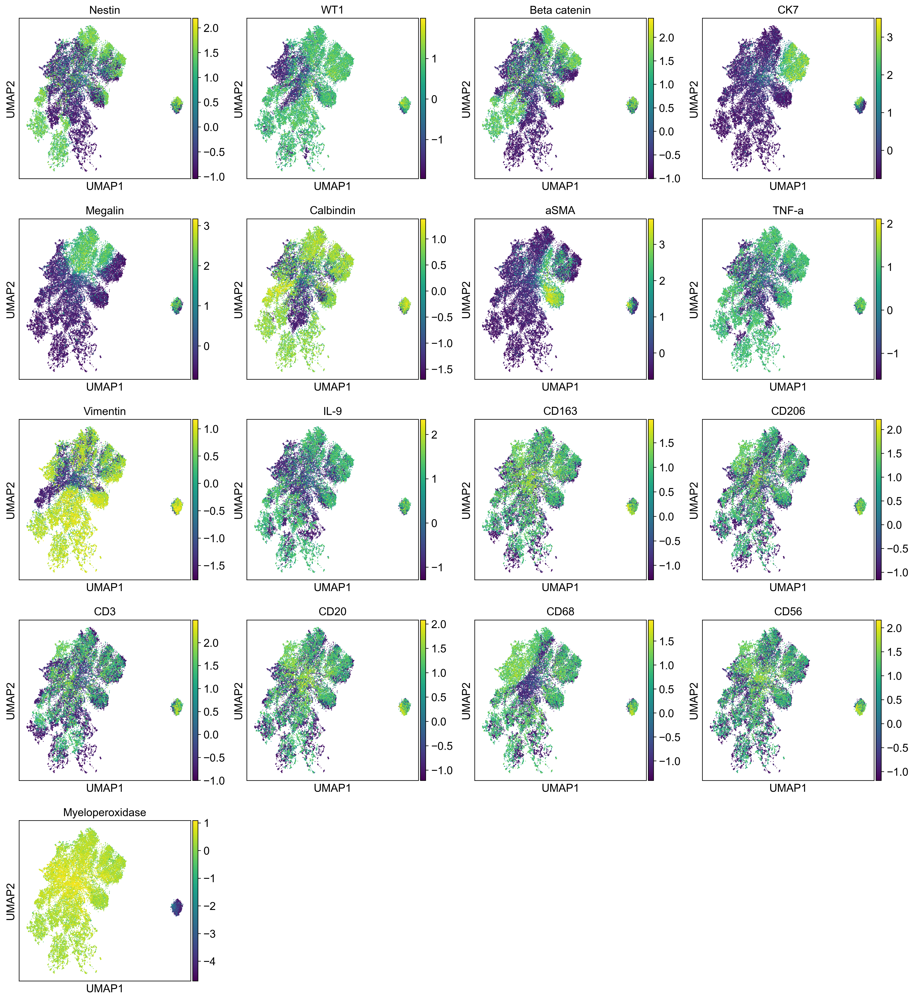

In [3]:
data_1

sc.settings.set_figure_params(dpi=150, frameon=True)

sc.pl.umap(adata, color=data_1.columns)

In [ ]:
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np

# Define parameter ranges
n_neighbors_values = [5, 10, 20, 30, 50]
min_dist_values = [0.01, 0.1, 0.25, 0.5, 0.75]

# n_neighbors_values = [5]
# min_dist_values = [0.01  ]         

# Create figure
fig, axes = plt.subplots(5, 5, figsize=(15, 15))
fig.suptitle("UMAP Projections with Different Parameters", fontsize=16)

# Store the original adata.obsm['X_umap'] to restore it later
original_umap = None
if 'X_umap' in adata.obsm:
    original_umap = adata.obsm['X_umap'].copy()

# Generate UMAP projections
for i, n_neighbors in enumerate(n_neighbors_values):
    for j, min_dist in enumerate(min_dist_values):

        print(i, j)
        ax = axes[i, j]
        
        # Compute UMAP with current parameters
        sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=5)
        sc.tl.umap(adata, min_dist=min_dist, random_state=42)
        
        # Get the UMAP coordinates
        umap_coords = adata.obsm['X_umap']
        
        # Color by leiden clusters
        scatter = ax.scatter(
            umap_coords[:, 0], 
            umap_coords[:, 1], 
            c=adata.obs['leiden'].astype('category').cat.codes, 
            cmap="tab10", 
            edgecolor="k", 
            s=10
        )
        
        ax.set_title(f"n={n_neighbors}, d={min_dist}")
        ax.set_xticks([])
        ax.set_yticks([])

# Add legend
if 'leiden' in adata.obs:
    unique_clusters = sorted(adata.obs['leiden'].unique())
    handles = [plt.Line2D([0], [0], marker="o", color="w", 
                         markerfacecolor=plt.cm.tab10(i/len(unique_clusters)), 
                         markersize=8) 
              for i, c in enumerate(unique_clusters)]
    fig.legend(handles, unique_clusters, title="Cluster", 
              bbox_to_anchor=(1.05, 0.5), loc="center left")

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to fit the legend

# Restore original UMAP if it existed
if original_umap is not None:
    adata.obsm['X_umap'] = original_umap

plt.show()

0 0
0 1
0 2
0 3
0 4
1 0
1 1
1 2
1 3
1 4
2 0
2 1
2 2
2 3
2 4
3 0
3 1
3 2
3 3
3 4
4 0
4 1
4 2
4 3
4 4
